In [121]:
import pandas as pd
import umap
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
nuclei_results_df = pd.read_csv("shortFullSaveNewFile.csv")
nuclei_results_df = nuclei_results_df.set_index('index')
nuclei_results_df['wellid'] = nuclei_results_df.index.map(lambda x: x.split('_')[-1][:3])
metadata_columns = ['wellid']# 'wellid', 'seriesid', 'class_labels', 'GENE']
drop_columns = list(set(list(nuclei_results_df.isna().sum().sort_values(ascending=False)[nuclei_results_df.isna().sum().sort_values(ascending=False) > 0].index)))
numbered_columns = [col for col in nuclei_results_df.columns if "Object" in col or 'Number' in col]
umap_columns = list(set(nuclei_results_df.columns) - set(metadata_columns) - set(drop_columns) - set(numbered_columns))
# data = pd.read_csv("FullsaveNewFile.csv")
# data[["index"] + umap_columns].to_csv("shortFullSaveNewFile.csv", index=False)

In [167]:
M = pd.read_csv("MappedWithMetaDataFields.csv")

In [169]:
well_cell_line = dict(zip(list(M['well']), list(M['cell line'])))

In [125]:
nuclei_results_df.shape

(149780, 19)

In [186]:
nuclei_results_df["condition"] = nuclei_results_df.index.map(lambda x: well_cell_line[x.split('-')[-1]])
nuclei_results_df["plate"] = nuclei_results_df.index.map(lambda x: x.split('_')[-2])
nuclei_results_df["wellid"] = nuclei_results_df.index.map(lambda x: x.split('-')[-1])
nuclei_results_df["rowid"] = nuclei_results_df.index.map(lambda x: x.split('-')[-1][0])
nuclei_results_df["columnid"] = nuclei_results_df.index.map(lambda x: x.split('-')[-1][1:])

In [213]:
nuclei_results_df = nuclei_results_df.reset_index()
nuclei_results_df.index = nuclei_results_df.index.map(lambda x: f"C{x}")

In [216]:
umap_columns = [
    "AreaShape_Perimeter",
    "AreaShape_Orientation",
    "AreaShape_Solidity",
    "Intensity_MeanIntensity_NucleiRescaleIntensity",
    "AreaShape_MajorAxisLength",
    "AreaShape_MaxFeretDiameter",
    "AreaShape_MaximumRadius",
    "AreaShape_MeanRadius",
    "AreaShape_MedianRadius",
    "AreaShape_MinFeretDiameter",
    "AreaShape_MinorAxisLength",
    "AreaShape_Compactness",
    "AreaShape_ConvexArea",
    "AreaShape_Eccentricity",
    "AreaShape_EquivalentDiameter",
    "AreaShape_EulerNumber",
    "AreaShape_Extent",
    "AreaShape_FormFactor"
]


In [231]:
import pandas as pd


# Define a function to remove outliers using IQR
def remove_outliers_iqr(df):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    # Calculate the IQR
    IQR = Q3 - Q1
    # Define the acceptable range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Filter the DataFrame
    return df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]

# Remove outliers
nuclei_results_df_cleaned = nuclei_results_df.copy()
X = remove_outliers_iqr(nuclei_results_df[umap_columns])

# print("Original DataFrame:")
# print(nuclei_results_df)
# print("\nDataFrame without outliers:")
# print(nuclei_results_df_cleaned)


In [232]:
nuclei_results_df_cleaned.shape, nuclei_results_df.shape

((149780, 24), (149780, 24))

In [238]:
nuclei_results_df_cleaned = nuclei_results_df.loc[list(X.index)]
nuclei_results_df_cleaned[umap_columns] = X

In [239]:
# reducer = umap.UMAP(n_neighbors=8, min_dist=0.001)
# embedding = reducer.fit_transform(StandardScaler().fit_transform(np.array(nuclei_results_df[umap_columns].values, dtype=float)))
# fig, ax = plt.subplots(figsize=(16, 10))
# sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=nuclei_results_df['wellid'], ax=ax)

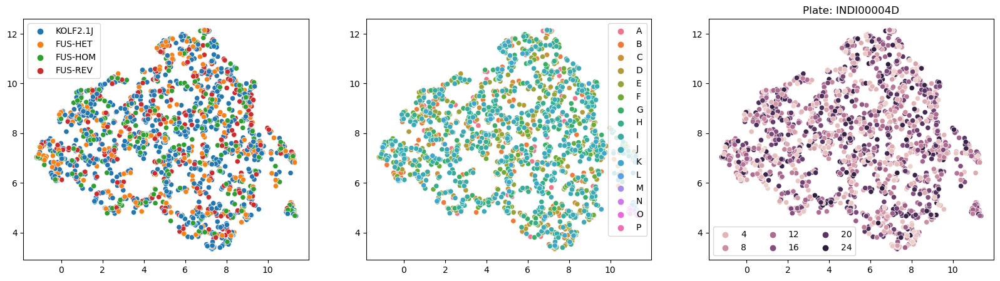

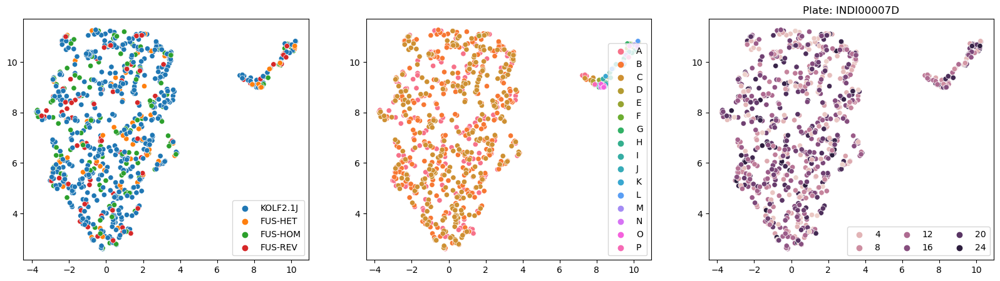

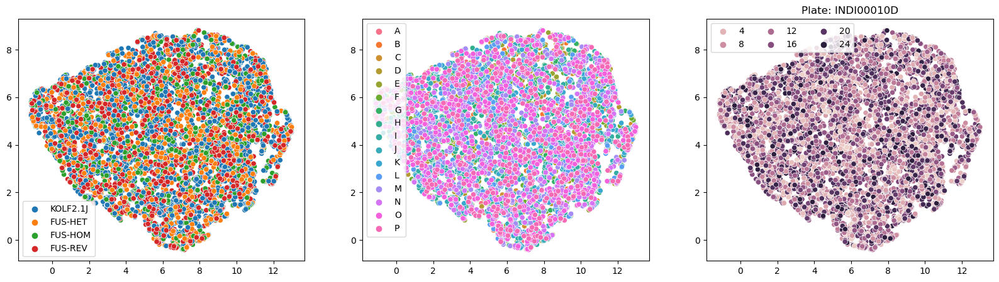

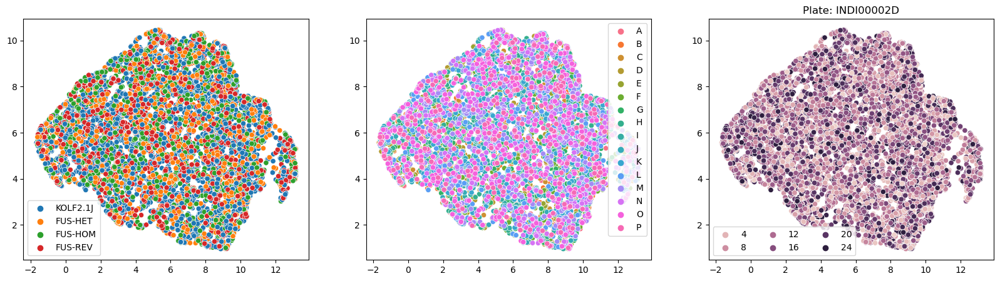

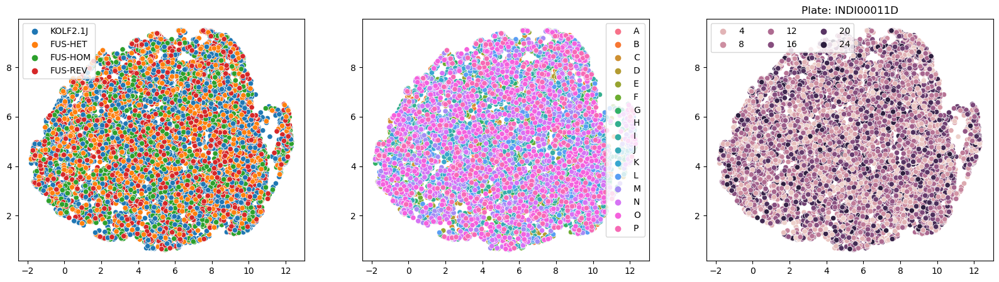

...

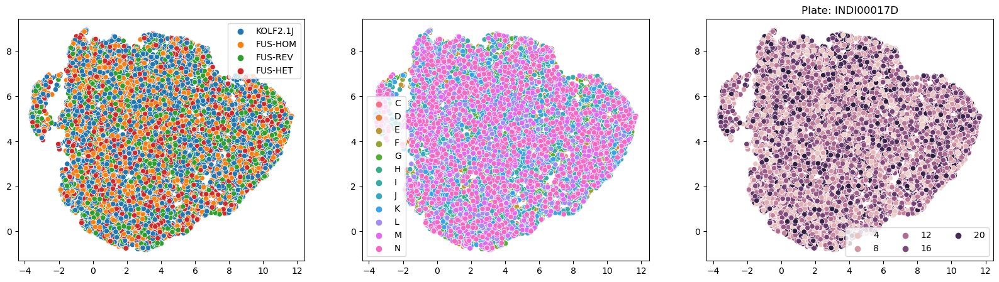

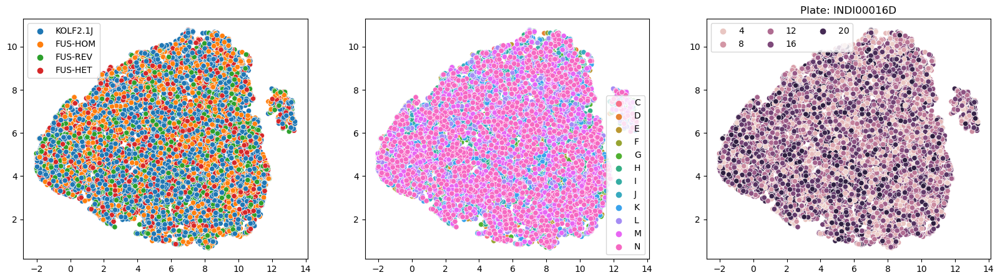

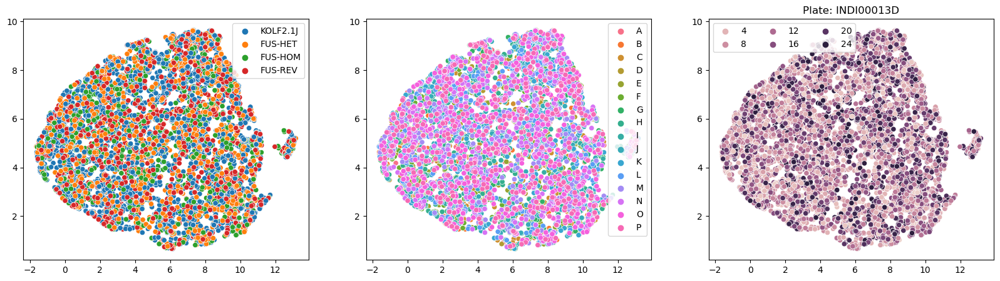

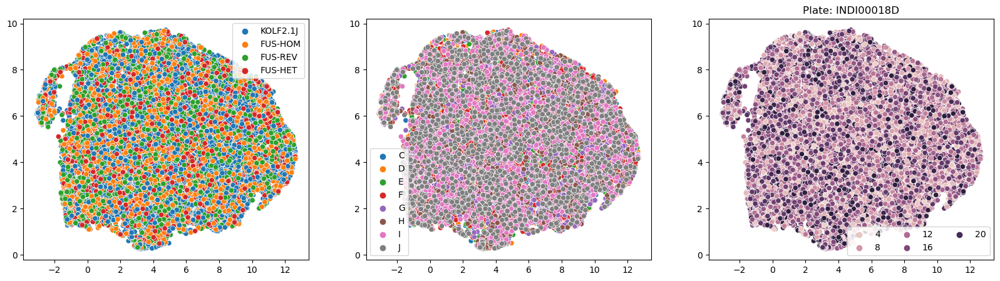

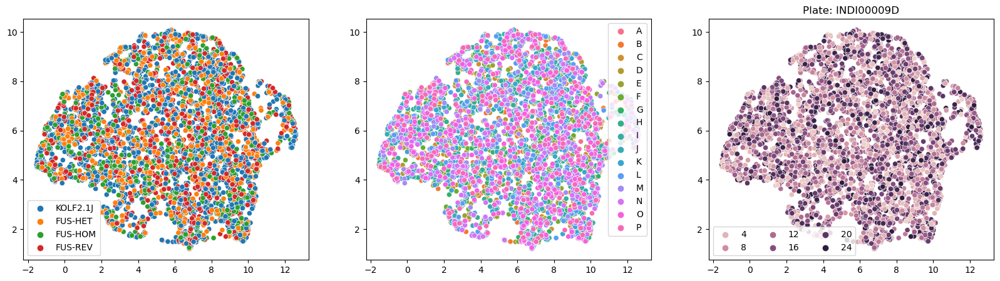

In [255]:
for plat in list(set(nuclei_results_df_cleaned['plate'].unique())):
    K = nuclei_results_df_cleaned[nuclei_results_df_cleaned['index'].str.contains(plat)].copy()
    K['columnid'] = K['columnid'].map(int)
    K = K.sort_values(by=['rowid', 'columnid'])
    reducer = umap.UMAP(n_neighbors=8, min_dist=0.1)
    embedding = reducer.fit_transform(StandardScaler().fit_transform(np.array(K[umap_columns].values, dtype=float)))

    fig, ax = plt.subplots(figsize=(20, 5), ncols=3)
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=list(K['condition']), ax=ax[0])
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=list(K['rowid']), ax=ax[1])
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=list(K['columnid']), ax=ax[2])
    plt.legend(ncol=3)
    plt.title(f"Plate: {plat}")

In [142]:
# K = nuclei_results_df[nuclei_results_df.index.str.contains('INDI00012D')]
# reducer = umap.UMAP(n_neighbors=8, min_dist=0.001)
# embedding = reducer.fit_transform(StandardScaler().fit_transform(np.array(K[umap_columns].values, dtype=float)))
# fig, ax = plt.subplots(figsize=(8, 5))
# sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=K['wellid'], ax=ax)
# sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=K.index.map(lambda x: x.split("_")[2]), ax=ax)
# plt.xlabel("umap1")
# plt.ylabel("umap2")

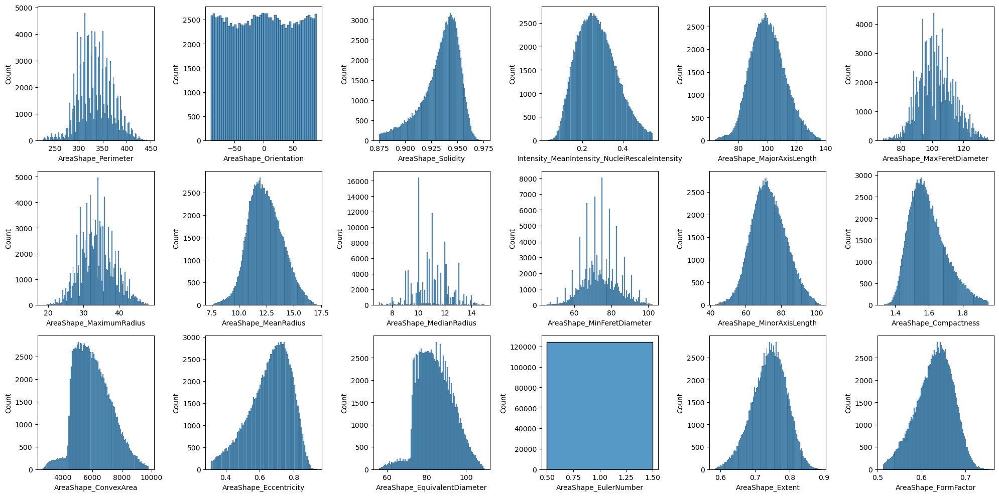

In [256]:
fig, ax = plt.subplots(ncols=6, nrows=3, figsize=(20, 10))
axslist = ax.reshape(-1)
for e, col in enumerate(umap_columns):
    sns.histplot(data=nuclei_results_df_cleaned[col], ax=axslist[e])
plt.tight_layout()

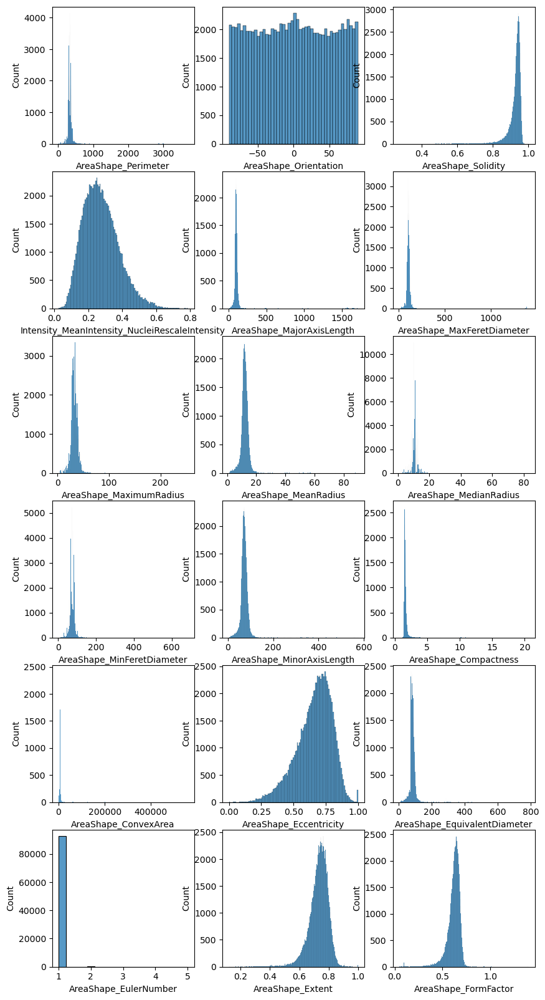

In [89]:
fig, ax = plt.subplots(ncols=3, nrows=6, figsize=(10, 20))
axslist = ax.reshape(-1)
for e, col in enumerate(umap_columns):
    sns.histplot(data=nuclei_results_df[col], ax=axslist[e])

/var/folders/y5/tr1yp82s2ns2_4g_6flxk45jrqb07t/T/ipykernel_8608/683240839.py:4: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=nuclei_results_df_cleaned, x=col, ax=axslist[e], hue="plate")


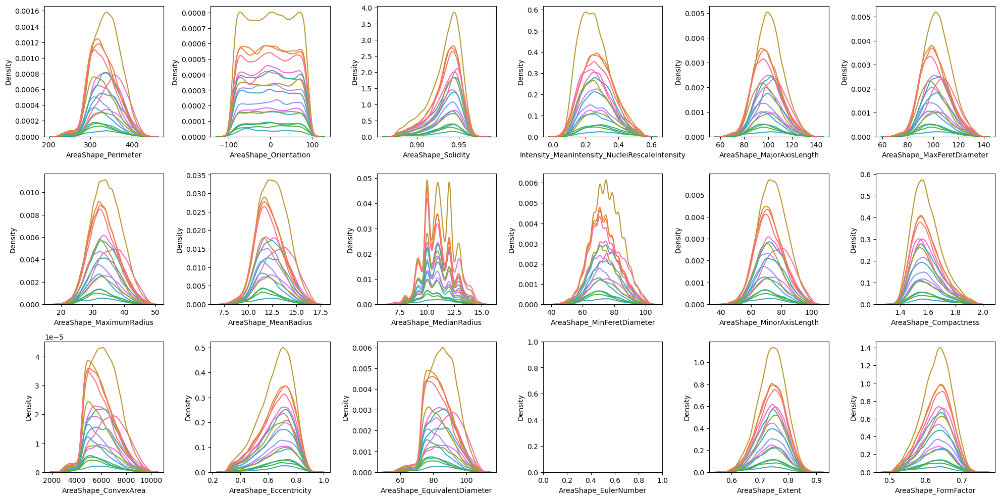

In [259]:
fig, ax = plt.subplots(ncols=6, nrows=3, figsize=(20, 10))
axslist = ax.reshape(-1)
for e, col in enumerate(umap_columns):
    sns.kdeplot(data=nuclei_results_df_cleaned, x=col, ax=axslist[e], hue="plate")
    axslist[e].get_legend().remove()
plt.tight_layout()

In [261]:
nuclei_results_df['index'].map(lambda x: x.split('_')[-2]).value_counts()

INDI00018D    20553
INDI00016D    14953
INDI00017D    14949
INDI00015D    13506
INDI00011D    11752
INDI00006D    11207
INDI00019D    10316
INDI00002D     8839
INDI00010D     8831
INDI00013D     7633
INDI00009D     5802
INDI00014D     4655
INDI00012D     4394
INDI00008D     4163
INDI00004D     2508
INDI00005D     2492
INDI00003D     1888
INDI00007D     1339
Name: index, dtype: int64

Text(0, 0.5, 'umap2')

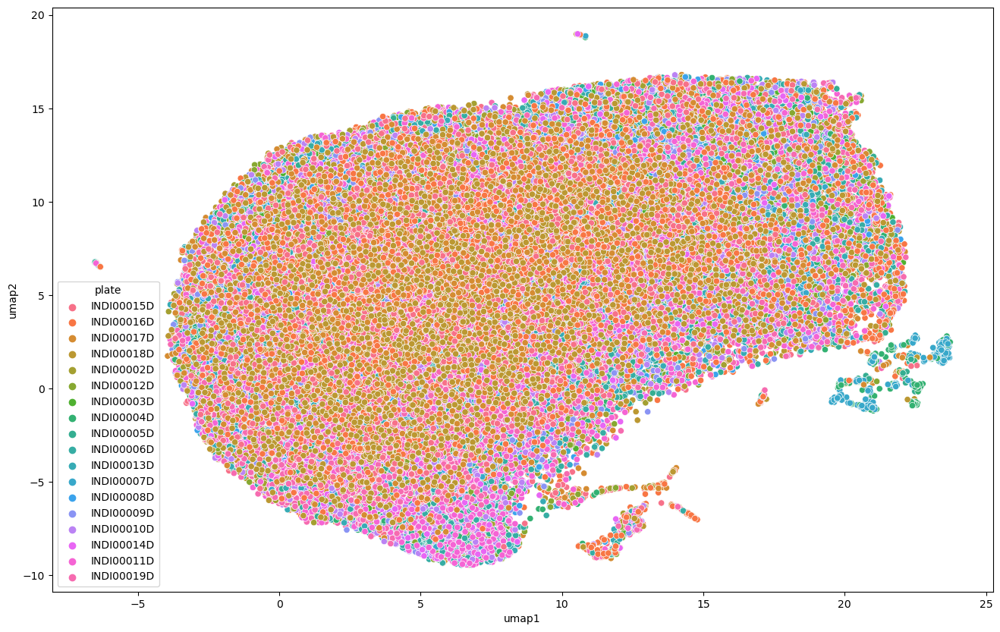

In [262]:
K = nuclei_results_df.copy()# [nuclei_results_df.index.str.contains('INDI00015D')]
reducer = umap.UMAP(n_neighbors=10, min_dist=0.8)
embedding = reducer.fit_transform(StandardScaler().fit_transform(np.array(K[umap_columns].values, dtype=float)))
fig, ax = plt.subplots(figsize=(16, 10))
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=K['plate'], ax=ax)
# sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=K.index.map(lambda x: x.split("_")[2]), ax=ax)
# sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=K.index.map(lambda x: x.split('_')[-2]), ax=ax)
# sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=K.index.map(lambda x: well_cell_line[x.split('-')[-1]]), ax=ax)
plt.xlabel("umap1")
plt.ylabel("umap2")

<Axes: xlabel='umap1', ylabel='umap2'>

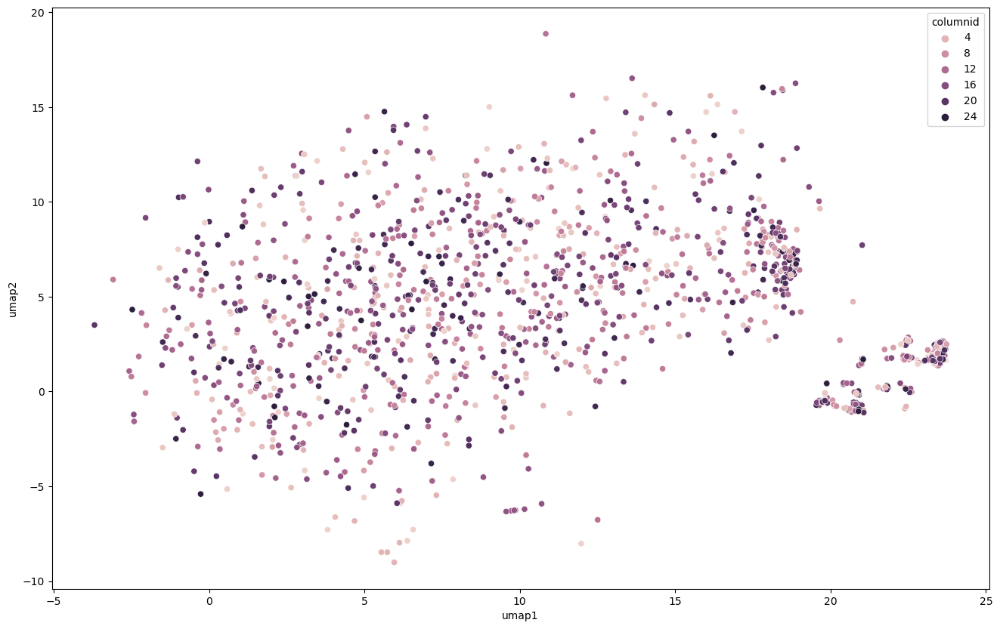

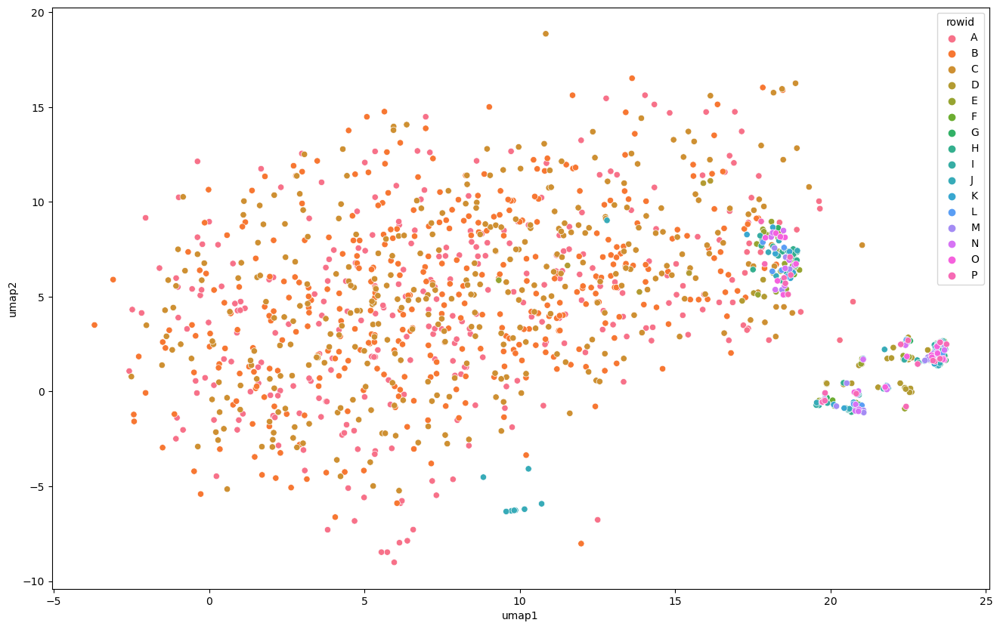

In [271]:
Z = pd.DataFrame({'umap1': embedding[:, 0], 'umap2': embedding[:, 1], 'plate': list(K['plate']), 'columnid': list(K['columnid']), 'rowid': list(K['rowid'])})
fig, ax = plt.subplots(figsize=(16, 10))
Z['columnid'] = Z['columnid'].map(int)
Z = Z.sort_values(by=['rowid', 'columnid'])

sns.scatterplot(data=Z[Z['plate']=='INDI00007D'], x="umap1", y="umap2", hue="columnid", ax=ax)

fig, ax = plt.subplots(figsize=(16, 10))
Z['columnid'] = Z['columnid'].map(int)
Z = Z.sort_values(by=['rowid', 'columnid'])

sns.scatterplot(data=Z[Z['plate']=='INDI00007D'], x="umap1", y="umap2", hue="rowid", ax=ax)

<Axes: xlabel='umap1', ylabel='umap2'>

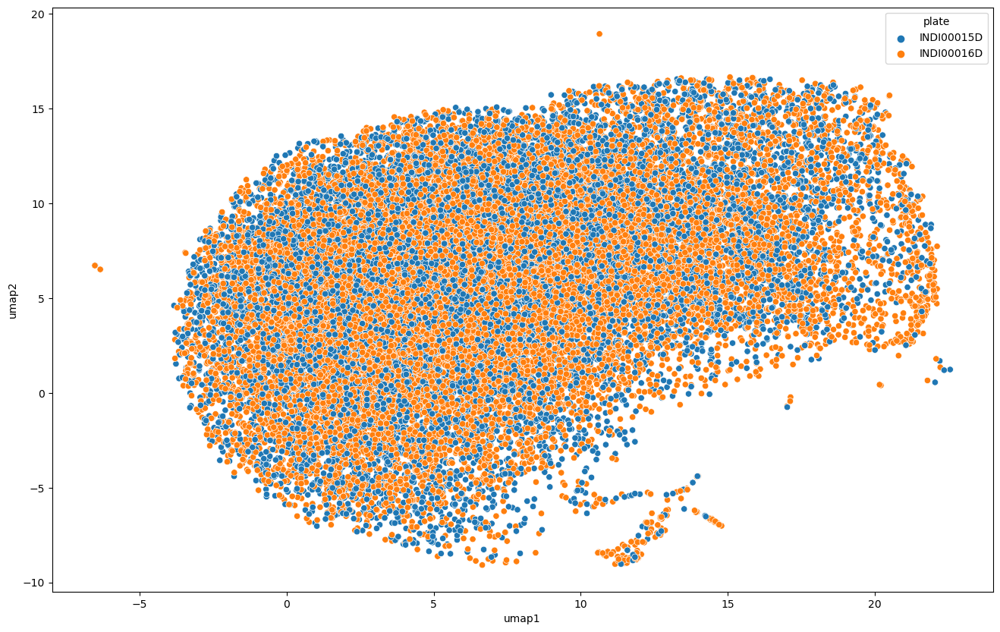

In [270]:
Z = pd.DataFrame({'umap1': embedding[:, 0], 'umap2': embedding[:, 1], 'plate': list(K['plate']), 'columnid': list(K['columnid']), 'rowid': list(K['rowid'])})
fig, ax = plt.subplots(figsize=(16, 10))
Z['columnid'] = Z['columnid'].map(int)
Z = Z.sort_values(by=['rowid', 'columnid'])

sns.scatterplot(data=Z[Z['plate'].isin(['INDI00015D', 'INDI00016D'])], x="umap1", y="umap2", hue="plate", ax=ax)

In [182]:
def maps(x):
    if '15' in x or '16' in x or '17' in x or '18' in x:
        return "ArrayedLayout"
    else:
        return "RandomLayout"

In [272]:
# fig, ax = plt.subplots(figsize=(16, 10))
# sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=K.index.map(lambda x: maps(x.split('_')[-2])), ax=ax)
# plt.xlabel("umap1")
# plt.ylabel("umap2")